In [1]:
import sys
import os
import platform
import importlib
import glob
import calendar
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import cartopy
import cartopy.crs as ccrs
import warnings

import numpy as np
import pandas as pd
import netCDF4
from tqdm import tqdm
import json
import joblib
import re
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score
from bayes_opt import BayesianOptimization
import multiprocessing as mp

import cupy as cp # Cupy is used to handle data on GPU
import xgboost as xgb
from cuml.linear_model import ElasticNet as cuML_ElasticNet
import cuml
from cuml.ensemble import RandomForestRegressor as cuRF
from cuml.svm import SVR
import lightgbm as lgb
import torch
import tensorflow as tf
import keras
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Input, Dense, Dropout, BatchNormalization
from keras.callbacks import EarlyStopping, ReduceLROnPlateau #, LearningRateScheduler

base_FP = '/home/subin/data'
cpuserver_data_FP = '/home/subin/cpuserver_data'
print(base_FP)
print(cpuserver_data_FP)
sys.path.append(base_FP + '/python_modules')

import HydroAI.Data as hData
import HydroAI.ERA5_land as hERA5
import HydroAI.SMAP as hSMAP
import HydroAI.Grid as hGrid
import HydroAI.TC_like as hTCL
import develop_HydroAI.HydroAI.Plot as hPlot
import develop_HydroAI.HydroAI.Shallow_ML as hSML
import HydroAI.Land_Properties as hLP
import develop_HydroAI.HydroAI.HLS as hHLS

importlib.reload(hData);
importlib.reload(hERA5);
importlib.reload(hGrid);
importlib.reload(hSMAP);
importlib.reload(hTCL);
importlib.reload(hPlot);
importlib.reload(hSML);
importlib.reload(hLP);
importlib.reload(hHLS);

/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-09-19 02:28:51.519734: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-19 02:28:51.553996: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-19 02:28:51.554021: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-19 02

/home/subin/data
/home/subin/cpuserver_data


### Load dataset

In [4]:
insitu_dict = {
    316:(35.1144, 126.9974), # MDS  (35.11425, 35.11455) & (126.99735, 126.99765)
    689:(35.1008, 126.8985), # GJNG (35.10075, 35.10105) & (126.89835, 126.89865)
    708:(35.1289, 126.7452), # GS   (35.12895, 35.12925) & (126.74505, 126.74535)
    722:(35.1368, 126.9288), # JSD  (35.13675, 35.13705) & (126.92865, 126.92895)
    783:(35.2303, 126.8408), # GGW  (35.23005, 35.23035) & (126.84075, 126.84105)
    788:(35.1316, 126.8813)  # PA   (35.13135, 35.13165) & (126.88125, 126.88155)
}

# (lat min, lat max, lon min, lon max)
insitu_df_year_dict ={
    316:(35.11425, 35.11455, 126.99735, 126.99765),
    689:(35.10075, 35.10105, 126.89835, 126.89865),
    708:(35.12895, 35.12925, 126.74505, 126.74535),
    722:(35.13675, 35.13705, 126.92865, 126.92895),
    783:(35.23005, 35.23035, 126.84075, 126.84105),
    788:(35.13135, 35.13165, 126.88125, 126.88155)
}

In [13]:
df_insitu = pd.read_csv(f'{cpuserver_data_FP}/HLS/Korea/UHI_project_L30/Dataset_in_situ_2014_2023.csv')
# Convert df_insitu's date column from object (string) to datetime first
df_insitu['date'] = pd.to_datetime(df_insitu['date'], format='%Y-%m-%d')
# Then convert it to the int64 format (YYYYMMDD)
df_insitu['date'] = df_insitu['date'].dt.strftime('%Y%m%d').astype(int)
print(np.shape(df_insitu))
df_insitu.head()

(20105, 12)


,location,date,ave_temperature,min_temperature,min_temperature_time,max_temperature,max_temperature_time,precipitation,max_wind_speed,max_wind_speed_time,ave_wind_speed,max_wind_speed_direction
0,316,20140101,-2.3,-5.0,508.0,1.3,1518.0,0.0,16.7,1353.0,9.5,302.1
1,316,20140102,-1.4,-3.8,247.0,1.6,1506.0,0.0,16.0,509.0,5.0,44.4
2,316,20140103,0.3,-2.3,0.0,5.1,1231.0,0.0,10.3,2202.0,4.4,29.9
3,316,20140104,-4.0,-6.6,654.0,0.2,1512.0,0.0,10.8,58.0,3.4,30.8
4,316,20140105,-3.9,-5.9,3.0,-0.7,1517.0,0.0,14.7,2357.0,5.4,49.0


In [6]:
'''
print(np.unique(df_year[(df_year['latitude'].values < 35.1316 + 0.0005) & \
                        (df_year['latitude'].values > 35.1316 - 0.0005)]['latitude'].values))

print(np.unique(df_year[(df_year['longitude'].values < 126.8813 + 0.0005) & \
                        (df_year['longitude'].values > 126.8813 - 0.0005)]['longitude'].values))
print(len(df_year[(df_year['latitude'].values == 35.11455) & (df_year['longitude'].values == 126.99735)]))
'''

"\nprint(np.unique(df_year[(df_year['latitude'].values < 35.1316 + 0.0005) &                         (df_year['latitude'].values > 35.1316 - 0.0005)]['latitude'].values))\n\nprint(np.unique(df_year[(df_year['longitude'].values < 126.8813 + 0.0005) &                         (df_year['longitude'].values > 126.8813 - 0.0005)]['longitude'].values))\nprint(len(df_year[(df_year['latitude'].values == 35.11455) & (df_year['longitude'].values == 126.99735)]))\n"

In [55]:
save_path = f'{cpuserver_data_FP}/HLS/Korea/UHI_project_L30/2014_2023'
if not os.path.exists(save_path):
    os.makedirs(save_path)

for year_idx, year in enumerate(range(2014, 2023 + 1)):
    df_year = pd.read_csv(f'{cpuserver_data_FP}/HLS/Korea/UHI_project_L30/HLS_{year}_GJ.csv')
    # Cloud masking
    df_year['cloud'] = hHLS.is_cloud(df_year['qa'].values)
    df_year = df_year[(df_year.cloud == 0)]
    
    # Extract insitu yearly
    df_insitu_year = df_insitu[df_insitu['date'].isin(df_year['dates'])]
    
    pixels_idx = []
    for key, value in insitu_dict.items():
        df_year_lon_lat = insitu_df_year_dict[key]
        pixel1 = df_year[(df_year['latitude'].values == df_year_lon_lat[0]) & \
                         (df_year['longitude'].values == df_year_lon_lat[2])]
        pixel2 = df_year[(df_year['latitude'].values == df_year_lon_lat[1]) & \
                         (df_year['longitude'].values == df_year_lon_lat[2])]
        pixel3 = df_year[(df_year['latitude'].values == df_year_lon_lat[0]) & \
                         (df_year['longitude'].values == df_year_lon_lat[3])]
        pixel4 = df_year[(df_year['latitude'].values == df_year_lon_lat[1]) & \
                         (df_year['longitude'].values == df_year_lon_lat[3])]

        pixels_idx += list(pixel1.index)
        pixels_idx += list(pixel2.index)
        pixels_idx += list(pixel3.index)
        pixels_idx += list(pixel4.index)
        
        df_insitu_key = df_insitu_year[df_insitu_year['location']==key]

        # Merge & drop
        df_merged_pixel1 = pd.merge(pixel1, df_insitu_key[['date', 'ave_temperature', 'max_temperature']], left_on='dates', right_on='date', how='left')
        df_merged_pixel2 = pd.merge(pixel2, df_insitu_key[['date', 'ave_temperature', 'max_temperature']], left_on='dates', right_on='date', how='left')
        df_merged_pixel3 = pd.merge(pixel3, df_insitu_key[['date', 'ave_temperature', 'max_temperature']], left_on='dates', right_on='date', how='left')
        df_merged_pixel4 = pd.merge(pixel4, df_insitu_key[['date', 'ave_temperature', 'max_temperature']], left_on='dates', right_on='date', how='left')

        df_pixel_all = pd.concat([df_merged_pixel1, df_merged_pixel2, df_merged_pixel3, df_merged_pixel4], ignore_index=True)
        df_pixel_all = df_pixel_all.dropna(axis=0)
        df_pixel_all = df_pixel_all.drop(columns=['Unnamed: 0', 'date', 'cloud'])

        if key != 316:
            df_pixel_all = pd.concat([df_pixel_all_old, df_pixel_all], ignore_index=True)

        df_pixel_all_old = df_pixel_all

    need_to_recons_idx = list(df_year.index)
    need_to_recons_idx = list(set(need_to_recons_idx) - set(pixels_idx))
    need_to_recons = df_year.loc[need_to_recons_idx]
    need_to_recons = need_to_recons.dropna(axis=0)
    need_to_recons = need_to_recons.drop(columns=['Unnamed: 0', 'cloud'])
    need_to_recons.to_csv(f'{save_path}/need_to_recons_{year}.csv', sep=',')
        
    df_year = df_pixel_all

    del df_pixel_all_old; del df_pixel_all; del need_to_recons
    
    if year_idx != 0:
        df_year = pd.concat([df_year_old, df_year], ignore_index=True)
    df_year_old = df_year
    print(year, np.shape(df_year))

del df_year_old
df_year

2014 (582, 16)
2015 (1224, 16)
2016 (1794, 16)
2017 (2392, 16)
2018 (3074, 16)
2019 (3833, 16)
2020 (4460, 16)
2021 (5250, 16)
2022 (6781, 16)
2023 (8099, 16)


,latitude,longitude,dates,coastal,blue,green,red,nir,swir1,swir2,cirrus,tir1,tir2,qa,ave_temperature,max_temperature
0,35.11425,126.99735,20140106,0.00000,0.000000,0.000000,0.000000,0.0000,0.0000,0.0000,0.00000,0.000000,0.000000,0.0,-3.1,0.7
1,35.11425,126.99735,20140122,0.00000,0.000000,0.000000,0.000000,0.0000,0.0000,0.0000,0.00000,0.000000,0.000000,0.0,-8.7,-5.6
2,35.11425,126.99735,20140124,0.00000,0.000000,0.000000,0.000000,0.0000,0.0000,0.0000,0.00000,0.000000,0.000000,0.0,0.9,5.3
3,35.11425,126.99735,20140131,424.77777,0.054489,0.079067,0.114167,0.2016,0.2777,0.1899,35.11111,0.072978,0.076611,128.0,2.4,7.3
4,35.11425,126.99735,20140207,0.00000,0.000000,0.000000,0.000000,0.0000,0.0000,0.0000,0.00000,0.000000,0.000000,0.0,-2.8,-0.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8094,35.13165,126.88155,20231117,0.00000,0.000000,0.000000,0.000000,0.0000,0.0000,0.0000,0.00000,0.000000,0.000000,0.0,4.5,7.1
8095,35.13165,126.88155,20231125,0.00000,0.000000,0.000000,0.000000,0.0000,0.0000,0.0000,0.00000,0.000000,0.000000,0.0,1.2,7.4
8096,35.13165,126.88155,20231203,0.00000,0.000000,0.000000,0.000000,0.0000,0.0000,0.0000,0.00000,0.000000,0.000000,0.0,4.5,9.9
8097,35.13165,126.88155,20231219,0.00000,0.000000,0.000000,0.000000,0.0000,0.0000,0.0000,0.00000,0.000000,0.000000,0.0,1.5,4.7


In [70]:
size_in_bytes = sys.getsizeof(df_year)
size_in_gigabytes = size_in_bytes / (1024**3)
print(f"The size of the variable is: {size_in_gigabytes} gigabytes")

# Standard scaling
scaler_X = StandardScaler()
scaler_y = StandardScaler()

The size of the variable is: 0.000965610146522522 gigabytes


In [81]:
def make_indices_df(df):
    blue  = df['blue'].values
    green = df['green'].values
    red   = df['red'].values
    nir   = df['nir'].values
    swir1 = df['swir1'].values
    swir2 = df['swir2'].values
    tir1  = df['tir1'].values
    tir2  = df['tir2'].values
    
    # Extracted urban indices (ref: Mostofi_Hasanlou_2017_EELM) --> This paper has wrong equation of NDWI & MNDWI
    NDBaI = (swir1 - tir1) / (swir1 + tir1)
    NDBI  = (swir1 - nir) / (swir1 + nir)
    BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
    UI    = (swir2 - nir) / (swir2 + nir)
    IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
    EBBI  = (swir1 - nir) / ( 10*np.sqrt(swir1+tir1) )

    # Extracted vegetation indices
    NDVI  = (nir - red) / (nir + red)
    L = 1; C1 = 6; C2 = 7.5; G = 2.5 # constant for EVI
    EVI   = G * (nir - red) / (nir + C1*red - C2*blue + L)
    L = 0.5 # constant for SAVI
    SAVI  = (nir - red) * (L + 1) / (nir + red + L)

    # Water index
    NDWI  = (green - nir) / (green + nir) # wrong in ref paper ((nir - swir1) / (nir - swir1))
    MNDWI = (green - swir1) / (green + swir1) # wrong in ref paper ((green - nir) / (green + nir))

    # Make df
    df_geo_indices = pd.DataFrame()
    df_geo_indices['latitude'] = df['latitude'].values
    df_geo_indices['longitude'] = df['longitude'].values
    df_geo_indices['dates'] = df['dates'].values

    df_geo_indices['NDBaI'] = NDBaI
    df_geo_indices['NDBI'] = NDBI
    df_geo_indices['BI'] = BI
    df_geo_indices['UI'] = UI
    df_geo_indices['IBI'] = IBI
    df_geo_indices['EBBI'] = EBBI
    df_geo_indices['NDVI'] = NDVI
    df_geo_indices['SAVI'] = SAVI
    df_geo_indices['NDWI'] = NDWI
    df_geo_indices['MNDWI'] = MNDWI
    # Temperatures
    df_geo_indices['tir1'] = tir1
    df_geo_indices['tir2'] = tir2
    
    return df_geo_indices

In [82]:
df_geo_indices = make_indices_df(df_year)

df_geo_indices['ave_temperature'] = df_year['ave_temperature'].values
df_geo_indices['max_temperature'] = df_year['max_temperature'].values

'''
# Assuming default scaling factors for Landsat 8
M_L = 0.0003342  # Radiance multiplicative scaling factor (from metadata or assumed)
A_L = 0.1        # Radiance additive scaling factor (from metadata or assumed)

# Convert DN to TOA radiance
radiance = M_L * tir1+ A_L

K1 = 774.8853  # Example value for Landsat 8 Band 10 (adjust for your dataset)
K2 = 1321.0789

# Convert radiance to brightness temperature
BT = K2 / np.log((K1 / radiance) + 1)

# Emissivity estimation based on NDVI
emissivity = np.where(NDVI > 0.2, 0.004 * NDVI + 0.986, 0.99)

# LST formula
wavelength = 10.895  # Thermal infrared wavelength (for Landsat 8 Band 10, adjust if necessary)
p = 14380  # Planck constant (mK)

# LST calculation
LST = BT / (1 + (wavelength * BT / p) * np.log(emissivity))

# Convert from Kelvin to Celsius
LST_celsius = LST - 273.15

df_geo_indices['LST'] = LST_celsius

print(np.nanmin(LST_celsius), np.nanmax(LST_celsius))
print(np.nanmin(tir1), np.nanmax(tir1))
'''

df_geo_indices.head()

/tmp/ipykernel_2244579/488716657.py:12: RuntimeWarning: invalid value encountered in divide
  NDBaI = (swir1 - tir1) / (swir1 + tir1)
/tmp/ipykernel_2244579/488716657.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2244579/488716657.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2244579/488716657.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2244579/488716657.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2244579/488716657.py:17: RuntimeWarning: divide by zero encountered in divide
  EBBI  = (swir1 - nir) / ( 10*np.sqrt(swir1+tir1) )
/tmp/ipykernel_2244579/488716657.py:17: RuntimeWarning

,latitude,longitude,dates,NDBaI,NDBI,BI,UI,IBI,EBBI,NDVI,SAVI,NDWI,MNDWI,tir1,tir2,ave_temperature,max_temperature
0,35.11425,126.99735,20140106,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,0.000000,0.000000,-3.1,0.7
1,35.11425,126.99735,20140122,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,0.000000,0.000000,-8.7,-5.6
2,35.11425,126.99735,20140124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,0.000000,0.000000,0.9,5.3
3,35.11425,126.99735,20140131,0.58379,0.158773,0.209548,-0.029885,0.470898,0.012851,0.276892,0.160769,-0.43658,-0.55676,0.072978,0.076611,2.4,7.3
4,35.11425,126.99735,20140207,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,0.000000,0.000000,-2.8,-0.9


In [83]:
nan_count = df_geo_indices.isna().sum()
print(np.shape(df_geo_indices))
# Display the result
print(nan_count)
df_geo_indices = df_geo_indices.dropna(axis=0)
print(np.shape(df_geo_indices))

df_geo_indices.head()

(8099, 17)
latitude              0
longitude             0
dates                 0
NDBaI              4959
NDBI               4957
BI                 4956
UI                 4957
IBI                4961
EBBI               4956
NDVI               4957
SAVI                  0
NDWI               4957
MNDWI              4959
tir1                  0
tir2                  0
ave_temperature       0
max_temperature       0
dtype: int64
(3138, 17)


,latitude,longitude,dates,NDBaI,NDBI,BI,UI,IBI,EBBI,NDVI,SAVI,NDWI,MNDWI,tir1,tir2,ave_temperature,max_temperature
3,35.11425,126.99735,20140131,0.583790,0.158773,0.209548,-0.029885,0.470898,0.012851,0.276892,0.160769,-0.436580,-0.556760,0.072978,0.076611,2.4,7.3
10,35.11425,126.99735,20140405,0.345110,0.171342,0.216437,-0.008763,0.488709,0.012925,0.259187,0.153465,-0.412615,-0.545398,0.141289,0.128711,0.0,5.8
12,35.11425,126.99735,20140507,0.113800,-0.024671,0.044794,-0.262052,0.288366,-0.001936,0.521065,0.328847,-0.573192,-0.556389,0.209178,0.194400,8.8,15.3
15,35.11425,126.99735,20140530,-0.101973,-0.228867,-0.154430,-0.521454,0.118846,-0.018494,0.686225,0.462924,-0.675565,-0.528395,0.265300,0.258267,20.3,26.0
18,35.11425,126.99735,20140701,-0.083621,-0.302812,-0.238323,-0.609885,0.060174,-0.026224,0.758866,0.521424,-0.681546,-0.477224,0.235200,0.217878,18.2,24.8


### Feature importance (Already done)

In [38]:
seed = 0
y_related_columns = ['latitude', 'longitude', 'ave_temperature', 'max_temperature']
X_columns_list = [col for col in df_geo_indices.columns if col not in y_related_columns]
print(X_columns_list)

feature_imp_X = df_geo_indices[X_columns_list].values
feature_imp_y = df_geo_indices['ave_temperature'].values

feature_imp_X = scaler_X.fit_transform(feature_imp_X)
feature_imp_y = scaler_y.fit_transform(feature_imp_y.reshape(-1, 1)).flatten()

# random selection
_, feature_imp_X_small, _, feature_imp_y_small = train_test_split(feature_imp_X, feature_imp_y, test_size=0.1, random_state=seed)

feature_imp_X_df = pd.DataFrame(data=feature_imp_X_small, columns=X_columns_list)

feature_imp = hSML.create_feature_importance_df(feature_imp_X_df, feature_imp_y_small)
feature_imp.to_csv(f'{save_path}/feature_importance_{year}.csv', sep=',', index=False)

# Memory delete
del feature_imp_X_df
del feature_imp_X
del feature_imp_y

feature_imp.head()

['NDBaI', 'NDBI', 'BI', 'UI', 'IBI', 'EBBI', 'NDVI', 'SAVI', 'NDWI', 'MNDWI', 'tir1', 'tir2']


,feature,importance
0,tir1,0.653564
1,NDBaI,0.152104
2,tir2,0.095129
3,UI,0.034303
4,SAVI,0.008792


In [39]:
print(feature_imp)

   feature  importance
0     tir1    0.653564
1    NDBaI    0.152104
2     tir2    0.095129
3       UI    0.034303
4     SAVI    0.008792
5      IBI    0.008782
6       BI    0.008550
7     NDWI    0.008475
8     NDVI    0.007717
9     EBBI    0.007628
10   MNDWI    0.007491
11    NDBI    0.007466


In [78]:
feature_imp_list = feature_imp['feature'].head(9).values
#feature_imp_list = ['coastal', 'blue', 'green','red', 'nir', 'swir1', 'swir2', 'cirrus', 'tir1', 'tir2']

print(feature_imp_list)
print(np.shape(df_geo_indices))

predictors = df_geo_indices[feature_imp_list].values
outcome = df_geo_indices['ave_temperature'].values

# Standard scaling for predictors & outcome
predictors_scaled = scaler_X.fit_transform(predictors)
outcome_scaled = scaler_y.fit_transform(outcome.reshape(-1, 1)).flatten()
print(np.shape(predictors_scaled), np.shape(outcome_scaled))

X_train, X_test, y_train, y_test = train_test_split(predictors_scaled, outcome_scaled, test_size=0.2, random_state=seed)

['tir1' 'NDBaI' 'tir2' 'UI' 'SAVI' 'IBI' 'BI' 'NDWI' 'NDVI']
(3138, 14)
(3138, 9) (3138,)


### LGBM

|   iter    |  target   | learni... | max_depth | n_esti... | num_le... |
-------------------------------------------------------------------------
| 1         | -0.06065  | 0.1692    | 9.437     | 200.7     | 90.83     |
| 2         | -0.05897  | 0.1329    | 8.813     | 159.4     | 135.9     |
| 3         | -0.05929  | 0.1724    | 8.829     | 158.2     | 136.4     |
| 4         | -0.106    | 0.01      | 8.755     | 163.9     | 134.1     |
| 5         | -0.1092   | 0.01      | 7.882     | 159.5     | 140.5     |
| 6         | -0.06131  | 0.2374    | 9.442     | 157.6     | 133.7     |
| 7         | -0.05794  | 0.07582   | 5.632     | 157.4     | 134.3     |
| 8         | -0.06169  | 0.3       | 6.742     | 153.1     | 134.2     |
| 9         | -0.06173  | 0.3       | 4.565     | 155.1     | 130.2     |
| 10        | -0.1165   | 0.01      | 9.088     | 152.4     | 129.4     |
| 11        | -0.0617   | 0.3       | 3.0       | 154.2     | 134.0     |
| 12        | -0.05883  | 0.1747    | 

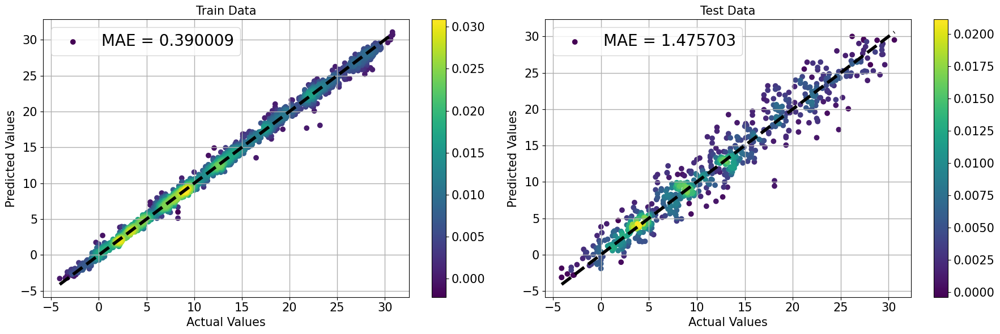

In [43]:
model_name = 'LGBM'

#Light GBM
score, best_params = hSML.Bayesian_optimization_LGBM(X_train, y_train,
                        pbounds = {
                                    'num_leaves': (20, 150),
                                    'max_depth': (3, 12),
                                    'learning_rate': (0.01, 0.3),
                                    'n_estimators': (50, 300)
                                }, n_iter=20)

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = lgb.LGBMRegressor(**best_params)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

# Evaluate the model
relation_square = model.score(X_train, y_train)
print('Relation coefficient: ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### RF

|   iter    |  target   | max_depth | max_fe... | min_sa... | n_esti... |
-------------------------------------------------------------------------
| 1         | -0.1184   | 55.33     | 0.743     | 30.93     | 277.0     |
| 2         | -0.117    | 42.94     | 0.6807    | 23.0      | 447.0     |
| 3         | -0.1174   | 45.6      | 0.7265    | 23.64     | 447.7     |
| 4         | -0.1178   | 36.29     | 0.5678    | 21.42     | 445.0     |
| 5         | -0.1087   | 42.05     | 0.9588    | 20.97     | 443.6     |
| 6         | -0.1086   | 41.88     | 0.999     | 20.49     | 442.8     |
| 7         | -0.1092   | 44.03     | 0.999     | 22.36     | 441.0     |
| 8         | -0.1079   | 45.63     | 0.999     | 18.06     | 442.6     |
| 9         | -0.1066   | 47.94     | 0.8467    | 13.03     | 444.3     |
| 10        | -0.1066   | 48.13     | 0.815     | 12.58     | 438.9     |
| 11        | -0.1068   | 53.31     | 0.999     | 14.54     | 441.4     |
| 12        | -0.1129   | 52.08     | 

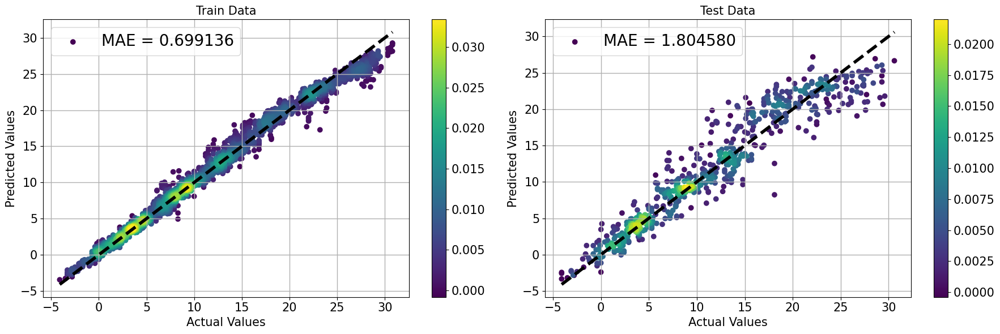

In [45]:
model_name = 'RF'
warnings.filterwarnings("ignore", message="The number of bins", category=UserWarning)
warnings.filterwarnings("ignore", message="To use pickling first train using float32 data to fit the estimator", category=UserWarning)

score, best_params = hSML.Bayesian_optimization_RF(X_train, y_train,
                        pbounds={
                                'n_estimators': (10, 500),
                                'max_features': (0.1, 0.999),
                                'max_depth': (1, 100),
                                'min_samples_split': (2, 50)
                            }, n_iter=20, library_model='RF_cuml')

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = cuRF(**best_params, n_streams=1) # For reproducible (n_streams)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

relation_square = model.score(X_train, y_train)
print('relation coefficient : ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### XGB

|   iter    |  target   | max_depth | max_fe... | min_sa... | n_esti... |
-------------------------------------------------------------------------


/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/xgboost/core.py:158: UserWarning: [03:23:51] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost-split_1722454208151/work/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)


| 1         | -0.06771  | 55.33     | 0.743     | 30.93     | 277.0     |
| 2         | -0.06918  | 42.94     | 0.6807    | 23.0      | 447.0     |
| 3         | -0.06747  | 55.96     | 0.8173    | 29.86     | 277.5     |
| 4         | -0.06501  | 59.33     | 0.999     | 24.16     | 279.9     |
| 5         | -0.06432  | 62.63     | 0.999     | 18.56     | 282.3     |
| 6         | -0.06804  | 65.21     | 0.7135    | 14.75     | 270.4     |
| 7         | -0.06612  | 60.44     | 0.999     | 21.86     | 290.3     |
| 8         | -0.06502  | 68.63     | 0.999     | 23.82     | 282.5     |
| 9         | -0.1271   | 50.0      | 0.2601    | 13.77     | 283.5     |
| 10        | -0.06536  | 62.11     | 0.999     | 40.46     | 295.2     |
| 11        | -0.06571  | 71.86     | 0.9136    | 25.92     | 305.4     |
| 12        | -0.06374  | 78.44     | 0.999     | 10.02     | 294.8     |
| 13        | -0.07168  | 77.0      | 0.6702    | 7.612     | 315.7     |
| 14        | -0.06476  | 82.17     | 

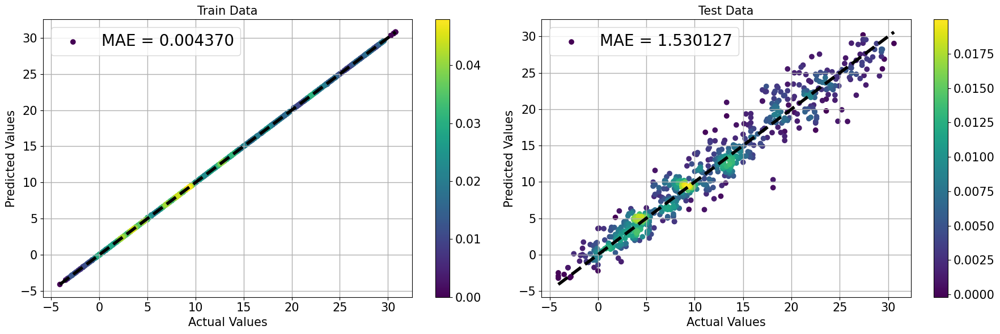

In [46]:
model_name = 'XGB'

# CuPy: CuPy is a GPU array library that is highly compatible with NumPy, making it easy to convert CPU-based NumPy arrays to GPU arrays.
#X_train = cp.array(X_train)
score, best_params = hSML.Bayesian_optimization_XGB(X_train, y_train,
                      pbounds={
                          'n_estimators': (10, 500),
                          'max_features': (0.1, 0.999),
                          'max_depth': (1, 100),
                          'min_samples_split': (2, 50)
                      }, n_iter=20)

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = xgb.XGBRegressor(**best_params)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

relation_square = model.score(X_train, y_train)
print('relation coefficient : ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### SVM

|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
| 1         | -0.1259   | 54.93     | 4.146     | 0.6067    | 0.5494    |
| 2         | -0.1101   | 42.42     | 3.938     | 0.4432    | 0.8929    |
| 3         | -0.1042   | 52.21     | 3.573     | 0.534     | 0.4801    |
| 4         | -0.06482  | 72.69     | 2.603     | 0.253     | 0.1913    |
| 5         | -0.1016   | 74.88     | 2.493     | 0.4186    | 0.8053    |
| 6         | -0.06484  | 72.09     | 2.644     | 0.2075    | 0.02257   |
| 7         | -0.3592   | 71.86     | 4.675     | 1.0       | 1.0       |
| 8         | -0.06749  | 70.27     | 2.0       | 0.01      | 0.01      |
| 9         | -0.06744  | 67.98     | 2.0       | 0.01      | 0.01      |
| 10        | -0.1446   | 65.84     | 2.0       | 1.0       | 0.01      |
| 11        | -0.06745  | 68.16     | 3.885     | 0.01      | 0.01      |
| 12        | -0.1221   | 66.53     | 

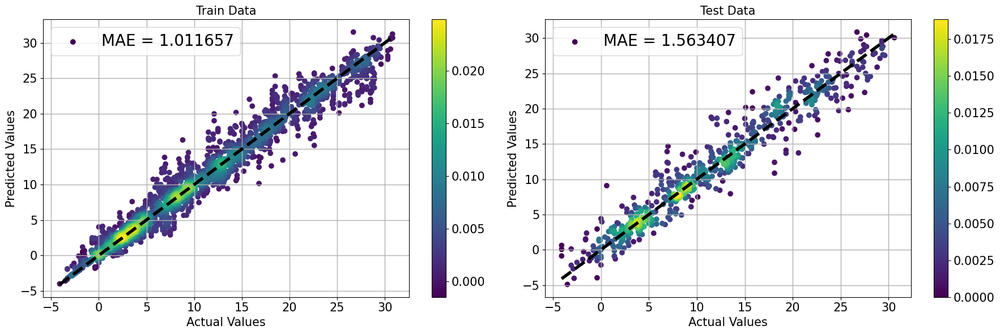

In [47]:
model_name = 'SVM'

score, best_params = hSML.Bayesian_optimization_SVM(X_train, y_train,
                        pbounds = {
                                    'C': (0.1, 100),
                                    'epsilon': (0.01, 1),
                                    'gamma': (0.01, 1),
                                    'degree': (2, 5)  # Only used if kernel is 'poly'
                                }, n_iter=20, library_model='SVM_cuml')

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = SVR(**best_params)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

relation_square = model.score(X_train, y_train)
print('relation coefficient : ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### ElasticNet

|   iter    |  target   |   alpha   | l1_ratio  |
-------------------------------------------------
| 1         | -1.01     | 5.533     | 0.7437    |
| 2         | -1.01     | 6.067     | 0.5904    |
| 3         | -0.1562   | 0.103     | 0.1152    |
| 4         | -1.01     | 1.181     | 1.0       |
| 5         | -0.1531   | 0.1       | 0.6989    |
| 6         | -1.01     | 10.0      | 0.1       |
| 7         | -0.5712   | 3.432     | 0.1       |
| 8         | -1.01     | 8.106     | 1.0       |
| 9         | -0.2029   | 0.6449    | 0.1       |
| 10        | -1.01     | 3.832     | 1.0       |
| 11        | -0.415    | 2.291     | 0.1       |
| 12        | -0.2      | 0.3316    | 0.4051    |
| 13        | -0.157    | 0.1       | 1.0       |
| 14        | -0.1752   | 0.3399    | 0.1       |
| 15        | -0.2918   | 1.391     | 0.1       |
| 16        | -0.154    | 0.1       | 0.3742    |
| 17        | -0.1549   | 0.1       | 0.8594    |
| 18        | -0.1519   | 0.1       | 0.5311    |


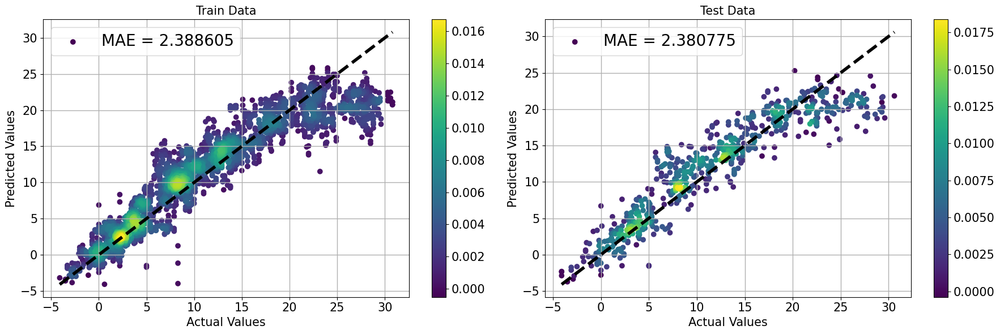

In [48]:
model_name = 'ElasticNet'

score, best_params = hSML.Bayesian_optimization_ElasticNet(X_train, y_train,
                      pbounds={
                            'alpha': (0.1, 10),    # 0 to ~
                            'l1_ratio': (0.1, 1.0) # 0 to 1
                      }, n_iter=20)

with open(f'{save_path}/{model_name}_bayesian_best_params.json','w') as f:
    json.dump(best_params, f, ensure_ascii=False, indent=4)

model = cuML_ElasticNet(**best_params)
model.fit(X_train, y_train)

# Save the model
joblib.dump(model, f'{save_path}/{model_name}_model.pkl')

relation_square = model.score(X_train, y_train)
print('relation coefficient : ', relation_square)

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### NN

2024-09-11 14:51:39.215944: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43253 MB memory:  -> device: 0, name: NVIDIA L40, pci bus id: 0000:61:00.0, compute capability: 8.9
2024-09-11 14:51:39.217301: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1928] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 43403 MB memory:  -> device: 1, name: NVIDIA L40, pci bus id: 0000:e1:00.0, compute capability: 8.9


Epoch 1/300


I0000 00:00:1726066303.871008 2088122 service.cc:145] XLA service 0x7f6390006990 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1726066303.871068 2088122 service.cc:153]   StreamExecutor device (0): NVIDIA L40, Compute Capability 8.9
I0000 00:00:1726066303.871070 2088122 service.cc:153]   StreamExecutor device (1): NVIDIA L40, Compute Capability 8.9
2024-09-11 14:51:43.903155: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-09-11 14:51:44.388562: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907
I0000 00:00:1726066305.414814 2088122 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_442_0', 4 bytes spill stores, 4 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_444_0', 4 bytes sp

258959/258959 ━━━━━━━━━━━━━━━━━━━━ 191s 722us/step - loss: 0.0217 - mae: 0.0335 - val_loss: 0.0062 - val_mae: 0.0142
Epoch 2/300
258959/258959 ━━━━━━━━━━━━━━━━━━━━ 190s 728us/step - loss: 0.0096 - mae: 0.0168 - val_loss: 0.0076 - val_mae: 0.0142
Epoch 3/300
258959/258959 ━━━━━━━━━━━━━━━━━━━━ 191s 733us/step - loss: 0.0079 - mae: 0.0147 - val_loss: 0.0090 - val_mae: 0.0130
Epoch 4/300
258959/258959 ━━━━━━━━━━━━━━━━━━━━ 191s 734us/step - loss: 0.0071 - mae: 0.0137 - val_loss: 0.0083 - val_mae: 0.0120
Epoch 5/300
258959/258959 ━━━━━━━━━━━━━━━━━━━━ 189s 723us/step - loss: 0.0064 - mae: 0.0130 - val_loss: 0.0027 - val_mae: 0.0102
Epoch 6/300
258959/258959 ━━━━━━━━━━━━━━━━━━━━ 190s 730us/step - loss: 0.0060 - mae: 0.0125 - val_loss: 0.0058 - val_mae: 0.0106
Epoch 7/300
258959/258959 ━━━━━━━━━━━━━━━━━━━━ 189s 727us/step - loss: 0.0056 - mae: 0.0121 - val_loss: 0.0053 - val_mae: 0.0093
Epoch 8/300
258959/258959 ━━━━━━━━━━━━━━━━━━━━ 188s 721us/step - loss: 0.0053 - mae: 0.0118 - val_loss: 0.011

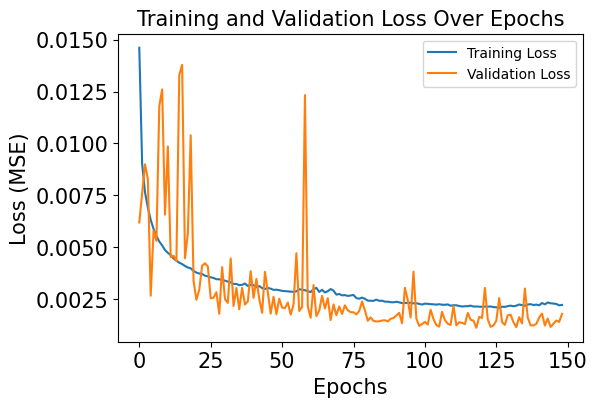

1294795/1294795 ━━━━━━━━━━━━━━━━━━━━ 602s 464us/step
323699/323699 ━━━━━━━━━━━━━━━━━━━━ 148s 456us/step


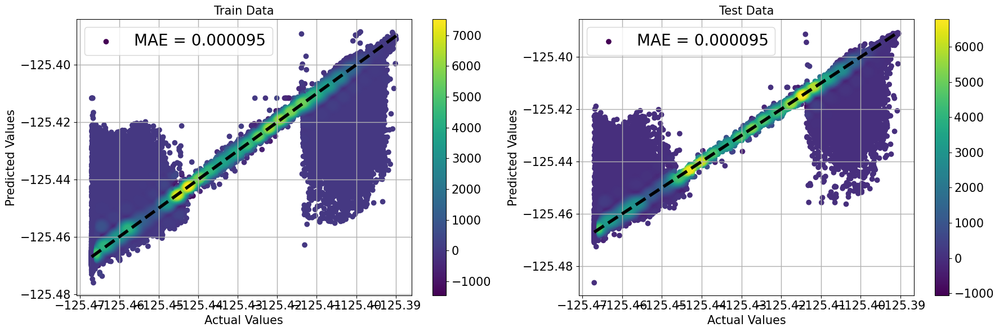

In [20]:
# NN with dropout/early stopping/adam #adagrad opti.
model_name = 'NN'

# Reproducibility
tf.random.set_seed(seed) #tensorflow
tf.keras.utils.set_random_seed(seed)
tf.config.experimental.enable_op_determinism() #tensorflow reproducible
os.environ["PYTHONHASHSEED"] = str(seed)
os.environ["TF_DETERMINISTIC_OPS"] = str(seed)
os.environ['TF_CUDNN_DETERMINISTIC'] = str(seed)
#Threads Num
#cpu_core = 20
#tf.config.threading.set_intra_op_parallelism_threads(cpu_core)
#tf.config.threading.set_inter_op_parallelism_threads(cpu_core)


# Define the model with Dropout layers
model = Sequential([
    Input(shape=(len(feature_imp_list),)),
    Dense(128, activation='relu'),
#    Dropout(0.2),                             
    Dense(64, activation='relu'),
#    Dropout(0.2),
    Dense(32, activation='relu'),
#    Dropout(0.2),
    Dense(16, activation='relu'),                     
#    Dropout(0.2), 
    Dense(1)                                          # Output layer for regression (no activation)
])
#BatchNormalization()


# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), # default learning rate = 0.001 
              loss='mse',               # Mean Squared Error loss for regression
              metrics=['mae'])          # Mean Absolute Error as a metric


# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=30, restore_best_weights=True) # Add early stopping to the training process
#rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, 
#                        min_lr=1e-6, verbose=1, min_delta=1e-5)

# Train the model with early stopping
history = model.fit(X_train, y_train, 
                    epochs=300,
                    batch_size=128,
                    validation_split=0.2,
                    callbacks=[early_stopping],
                    verbose=1)

# Evaluate the model on the test set
loss, mae = model.evaluate(X_test, y_test)
print(f"Test MAE: {mae:.4f}")

# Plotting the loss
plt.figure(figsize=(6, 4))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.show()
plt.close()

# Save the model
model.save(f'{save_path}/{model_name}_model.keras')

y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Inverse transform the predictions to get them back to the original scale
y_train_original = scaler_y.inverse_transform(y_train.reshape(-1, 1)).ravel()
y_test_original = scaler_y.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_train_original = scaler_y.inverse_transform(y_pred_train.reshape(-1, 1)).ravel()
y_pred_test_original = scaler_y.inverse_transform(y_pred_test.reshape(-1, 1)).ravel()

# Save pred & true dataframe
df_pred_true_train = pd.DataFrame({'y_true_train':y_train_original,
                                'y_pred_train':y_pred_train_original})
df_pred_true_train.to_csv(f'{save_path}/{model_name}_predtrue_train.csv', sep=',', index=False)

df_pred_true_test = pd.DataFrame({'y_true_test':y_test_original,
                                'y_pred_test':y_pred_test_original})
df_pred_true_test.to_csv(f'{save_path}/{model_name}_predtrue_test.csv', sep=',', index=False)

hPlot.plot_kde_scatter(y_train_original, y_pred_train_original, y_test_original, y_pred_test_original)

### Reconstruct

In [272]:
year = 2014
need_to_recons = pd.read_csv(f'{save_path}/need_to_recons_{year}.csv')

need_to_recons.head()

,Unnamed: 0,latitude,longitude,dates,coastal,blue,green,red,nir,swir1,swir2,cirrus,tir1,tir2,qa
0,0,35.27985,126.63015,20140106,246.00000,0.02760,0.0463,0.04285,0.23365,0.12190,0.0570,48.000000,0.032300,0.0365,192.0
1,1,35.27985,126.63045,20140106,308.00000,0.03325,0.0486,0.05070,0.24860,0.18755,0.0726,48.666668,0.033200,0.0387,192.0
2,2,35.27985,126.63075,20140106,379.00000,0.04000,0.0619,0.07340,0.23670,0.22650,0.1134,49.666668,0.036067,0.0411,192.0
3,3,35.27985,126.63105,20140106,356.33334,0.03990,0.0627,0.08600,0.22250,0.17290,0.1303,50.000000,0.039467,0.0470,192.0
4,4,35.27985,126.63135,20140106,331.00000,0.03560,0.0617,0.06710,0.24530,0.17225,0.0937,52.666668,0.043267,0.0492,192.0


In [273]:
need_to_recons_geo_indices = make_indices_df(need_to_recons)
need_to_recons_geo_indices = need_to_recons_geo_indices.dropna(axis=0)
need_to_recons_geo_indices.head()

/tmp/ipykernel_2244579/488716657.py:12: RuntimeWarning: invalid value encountered in divide
  NDBaI = (swir1 - tir1) / (swir1 + tir1)
/tmp/ipykernel_2244579/488716657.py:13: RuntimeWarning: invalid value encountered in divide
  NDBI  = (swir1 - nir) / (swir1 + nir)
/tmp/ipykernel_2244579/488716657.py:14: RuntimeWarning: invalid value encountered in divide
  BI    = ( (swir1 + red) - (nir + blue) ) / ( (swir1 + red) + (nir + blue) )
/tmp/ipykernel_2244579/488716657.py:15: RuntimeWarning: invalid value encountered in divide
  UI    = (swir2 - nir) / (swir2 + nir)
/tmp/ipykernel_2244579/488716657.py:16: RuntimeWarning: invalid value encountered in divide
  IBI   = ( 2*swir1/(swir1+nir) - (nir/(nir+red) - green/(green+swir1)) ) / ( 2*swir1/(swir1+nir) + (nir/(nir+red) - green/(green+swir1)) )
/tmp/ipykernel_2244579/488716657.py:17: RuntimeWarning: divide by zero encountered in divide
  EBBI  = (swir1 - nir) / ( 10*np.sqrt(swir1+tir1) )
/tmp/ipykernel_2244579/488716657.py:17: RuntimeWarning

,latitude,longitude,dates,NDBaI,NDBI,BI,UI,IBI,EBBI,NDVI,SAVI,NDWI,MNDWI,tir1,tir2
0,35.27985,126.63015,20140106,0.581064,-0.314302,-0.226526,-0.607776,0.092348,-0.028458,0.690054,0.368577,-0.669227,-0.449465,0.032300,0.0365
1,35.27985,126.63045,20140106,0.699207,-0.139975,-0.083830,-0.547945,0.158417,-0.012994,0.661209,0.371387,-0.672948,-0.588397,0.033200,0.0387
2,35.27985,126.63075,20140106,0.725276,-0.022021,0.040236,-0.352185,0.281210,-0.001991,0.526604,0.302370,-0.585399,-0.570735,0.036067,0.0411
3,35.27985,126.63105,20140106,0.628316,-0.125443,-0.006714,-0.261338,0.315460,-0.010763,0.442464,0.253247,-0.560309,-0.467742,0.039467,0.0470
4,35.27985,126.63135,20140106,0.598484,-0.174949,-0.079865,-0.447198,0.225447,-0.015735,0.570423,0.329025,-0.598046,-0.472537,0.043267,0.0492


In [274]:
# Predictors of need_to_reconstruct
predictors_2 = need_to_recons_geo_indices[feature_imp_list].values
predictors_scaled_2 = scaler_X.fit_transform(predictors_2)

#indices_to_update = list(need_to_reconstruct['original_index'])

In [275]:
# Best RF model's param
with open(f'{save_path}/RF_bayesian_best_params.json', 'r') as file:
    best_params_loaded_RF = json.load(file)
model_loaded_RF = cuRF(**best_params_loaded_RF)
model_loaded_RF.fit(predictors_scaled, outcome)
y_pred_2_RF = model_loaded_RF.predict(predictors_scaled_2)
y_pred_2_RF_original = scaler_y.inverse_transform(y_pred_2_RF.reshape(-1, 1)).ravel()

# Best XGB model's param
with open(f'{save_path}/XGB_bayesian_best_params.json', 'r') as file:
    best_params_loaded_XGB = json.load(file)
model_loaded_XGB = xgb.XGBRegressor(**best_params_loaded_XGB)
model_loaded_XGB.fit(predictors_scaled, outcome_scaled)
y_pred_2_XGB = model_loaded_XGB.predict(predictors_scaled_2)
y_pred_2_XGB_original = scaler_y.inverse_transform(y_pred_2_XGB.reshape(-1, 1)).ravel()

# Best SVM model's param
with open(f'{save_path}/SVM_bayesian_best_params.json', 'r') as file:
    best_params_loaded_SVM = json.load(file)
model_loaded_SVM = SVR(**best_params_loaded_SVM)
model_loaded_SVM.fit(predictors_scaled, outcome_scaled)
y_pred_2_SVM = model_loaded_SVM.predict(predictors_scaled_2)
y_pred_2_SVM_original = scaler_y.inverse_transform(y_pred_2_SVM.reshape(-1, 1)).ravel()

# Best LGBM model's param
with open(f'{save_path}/LGBM_bayesian_best_params.json', 'r') as file:
    best_params_loaded_LGBM = json.load(file)
model_loaded_LGBM = lgb.LGBMRegressor(**best_params_loaded_LGBM)
model_loaded_LGBM.fit(predictors_scaled, outcome_scaled)
y_pred_2_LGBM = model_loaded_LGBM.predict(predictors_scaled_2)
y_pred_2_LGBM_original = scaler_y.inverse_transform(y_pred_2_LGBM.reshape(-1, 1)).ravel()

'''
# Best ElasticNet model's param
with open(f'{save_path}/ElasticNet_bayesian_best_params.json', 'r') as file:
    best_params_loaded_ElasticNet = json.load(file)
model_loaded_ElasticNet = cuML_ElasticNet(**best_params_loaded_ElasticNet)
model_loaded_ElasticNet.fit(predictors_scaled, outcome_scaled)
y_pred_2_ElasticNet = model_loaded_ElasticNet.predict(predictors_scaled_2)
y_pred_2_ElasticNet_original = scaler_y.inverse_transform(y_pred_2_ElasticNet.reshape(-1, 1)).ravel()

# Load NN best model
model_loaded_NN = keras.models.load_model(f'{save_path}/NN_model.keras')
# No training model due to time consuming
y_pred_2_NN = model_loaded_NN.predict(predictors_scaled_2)
y_pred_2_NN_original = scaler_y.inverse_transform(y_pred_2_NN.reshape(-1, 1)).ravel()
'''

/home/subin/miniconda3/envs/cuml_env/lib/python3.10/site-packages/cuml/internals/api_decorators.py:344: UserWarning: For reproducible results in Random Forest Classifier or for almost reproducible results in Random Forest Regressor, n_streams=1 is recommended. If n_streams is > 1, results may vary due to stream/thread timing differences, even when random_state is set
  return func(**kwargs)


"\n# Best ElasticNet model's param\nwith open(f'{save_path}/ElasticNet_bayesian_best_params.json', 'r') as file:\n    best_params_loaded_ElasticNet = json.load(file)\nmodel_loaded_ElasticNet = cuML_ElasticNet(**best_params_loaded_ElasticNet)\nmodel_loaded_ElasticNet.fit(predictors_scaled, outcome_scaled)\ny_pred_2_ElasticNet = model_loaded_ElasticNet.predict(predictors_scaled_2)\ny_pred_2_ElasticNet_original = scaler_y.inverse_transform(y_pred_2_ElasticNet.reshape(-1, 1)).ravel()\n\n# Load NN best model\nmodel_loaded_NN = keras.models.load_model(f'{save_path}/NN_model.keras')\n# No training model due to time consuming\ny_pred_2_NN = model_loaded_NN.predict(predictors_scaled_2)\ny_pred_2_NN_original = scaler_y.inverse_transform(y_pred_2_NN.reshape(-1, 1)).ravel()\n"

In [276]:
df_recons = pd.DataFrame()
df_recons['latitude'] = need_to_recons_geo_indices['latitude'].values
df_recons['longitude'] = need_to_recons_geo_indices['longitude'].values
df_recons['dates'] = need_to_recons_geo_indices['dates'].values
df_recons['tir1'] = need_to_recons_geo_indices['tir1'].values
df_recons['tir2'] = need_to_recons_geo_indices['tir2'].values

df_recons['RF']   = y_pred_2_RF_original
df_recons['XGB']  = y_pred_2_XGB_original
df_recons['SVM']  = y_pred_2_SVM_original
df_recons['LGBM'] = y_pred_2_LGBM_original

df_recons.head()

,latitude,longitude,dates,tir1,tir2,RF,XGB,SVM,LGBM
0,35.27985,126.63015,20140106,0.032300,0.0365,26.219840,1.760905,3.678875,1.468177
1,35.27985,126.63045,20140106,0.033200,0.0387,16.356389,1.133258,4.063384,0.756530
2,35.27985,126.63075,20140106,0.036067,0.0411,12.956422,-0.008153,-1.594984,0.793063
3,35.27985,126.63105,20140106,0.039467,0.0470,17.955245,0.910260,0.924507,0.090534
4,35.27985,126.63135,20140106,0.043267,0.0492,23.047048,2.116570,1.523712,1.817760


In [277]:
lat_lon_df = df_recons[['latitude', 'longitude']].copy()
unique_combinations = lat_lon_df.drop_duplicates()
unique_combinations_list = list(unique_combinations.itertuples(index=False, name=None))

np.shape(unique_combinations_list)

(1065271, 2)

In [278]:
# Extract unique latitude, longitude, and date values
unique_latitudes = np.sort(df_recons['latitude'].unique())
unique_longitudes = np.sort(df_recons['longitude'].unique())
unique_dates = np.sort(df_recons['dates'].unique())

# Create an empty 3D array (latitudes, longitudes, dates), initialized with NaNs
lat_len = m #len(unique_latitudes)
lon_len = n #len(unique_longitudes)
date_len = len(unique_dates)

# Vectorized approach: map latitude, longitude, and dates to indices
lat_idx = np.searchsorted(unique_latitudes, df_recons['latitude'].values)
lon_idx = np.searchsorted(unique_longitudes, df_recons['longitude'].values)
date_idx = np.searchsorted(unique_dates, df_recons['dates'].values)

print(np.shape(lat_idx))
print(lon_idx)
print(date_idx)
    
data_vars = {}
var_name_list = ['tir1', 'tir2', 'RF', 'XGB', 'SVM', 'LGBM']

for var_name in var_name_list:
    # Initialize the 3D array with NaNs
    recons_array = np.full((m, n, date_len), np.nan)
    # Now use the indices to place values in the correct spots in the 3D array
    recons_array[lat_idx, lon_idx, date_idx] = df_recons[var_name].values
    data_vars[var_name] = recons_array

# To avoid permission error (due to already exist file)
nc_file_path = f'{save_path}/ave_temp_recons_{year}.nc'
if os.path.exists(nc_file_path):
    os.remove(nc_file_path)
    print(f'File {nc_file_path} has been deleted.')

domain_lat_ud = np.flipud(domain_lat)
hData.create_netcdf_file(nc_file=nc_file_path,
                         latitude=domain_lat_ud,
                         longitude=domain_lon,
                         **data_vars)

(14318443,)
[   0    1    2 ... 1245 1246 1247]
[ 0  0  0 ... 35 35 35]
File /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2014_2023/ave_temp_recons_2014.nc has been deleted.
NetCDF file /home/subin/cpuserver_data/HLS/Korea/UHI_project_L30/2014_2023/ave_temp_recons_2014.nc created successfully.


(800, 1333, 36)
True y -4.1 30.8


/tmp/ipykernel_2244579/627709615.py:8: RuntimeWarning: Mean of empty slice
  target = np.nanmean(data_vars[var_name], axis=2)


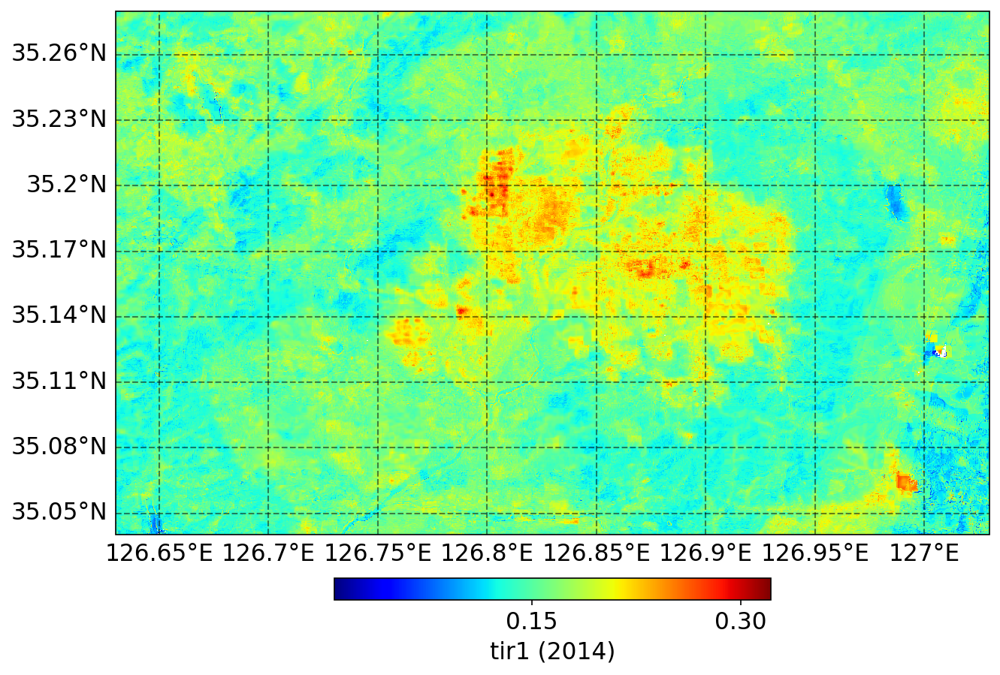

tir1 0.0 0.5041556


/tmp/ipykernel_2244579/627709615.py:8: RuntimeWarning: Mean of empty slice
  target = np.nanmean(data_vars[var_name], axis=2)


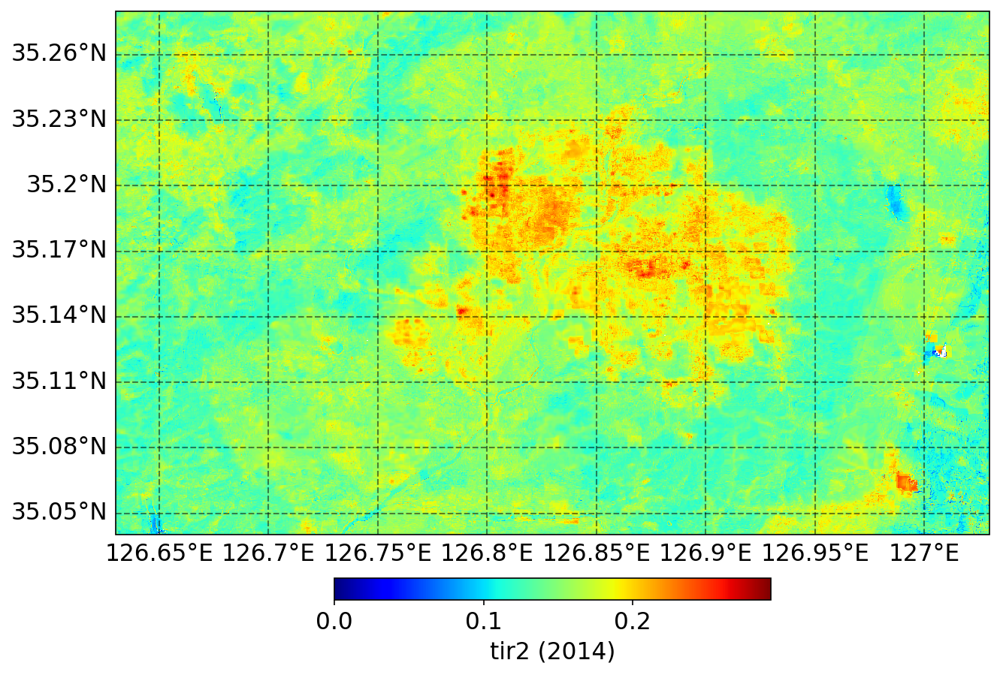

tir2 0.0 0.47581667


/tmp/ipykernel_2244579/627709615.py:8: RuntimeWarning: Mean of empty slice
  target = np.nanmean(data_vars[var_name], axis=2)


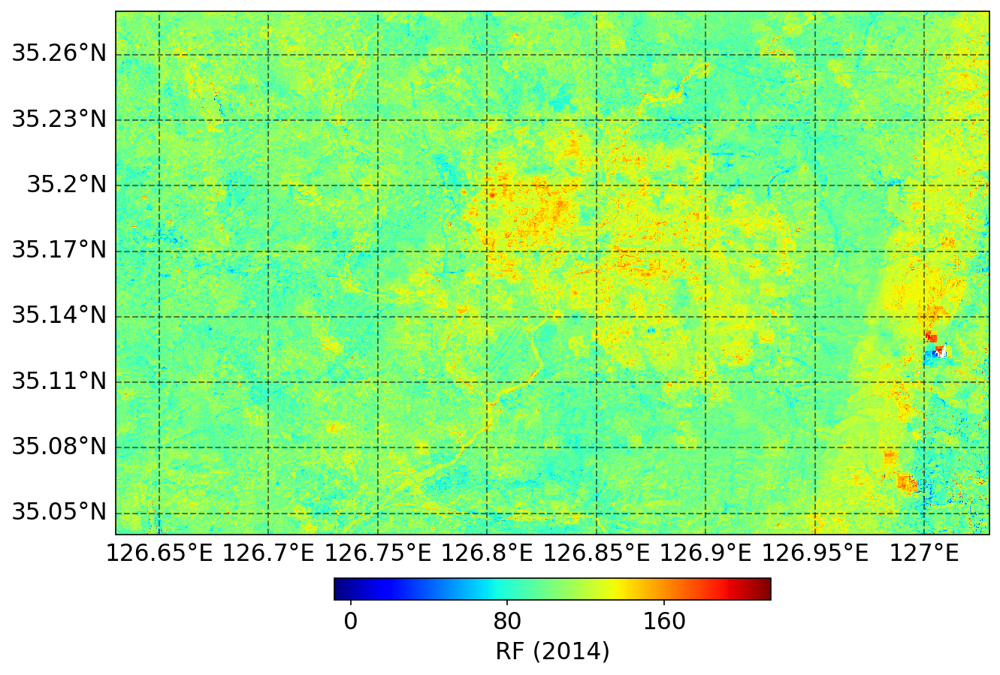

RF -17.811027541608787 242.139314519948


/tmp/ipykernel_2244579/627709615.py:8: RuntimeWarning: Mean of empty slice
  target = np.nanmean(data_vars[var_name], axis=2)


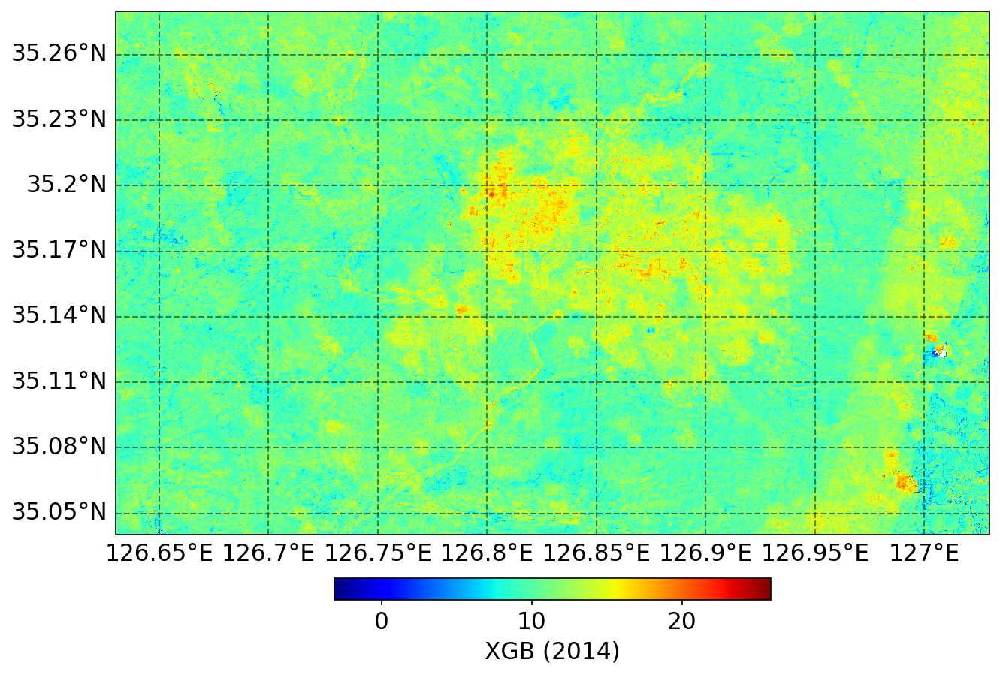

XGB -4.824838161468506 31.579689025878906


/tmp/ipykernel_2244579/627709615.py:8: RuntimeWarning: Mean of empty slice
  target = np.nanmean(data_vars[var_name], axis=2)


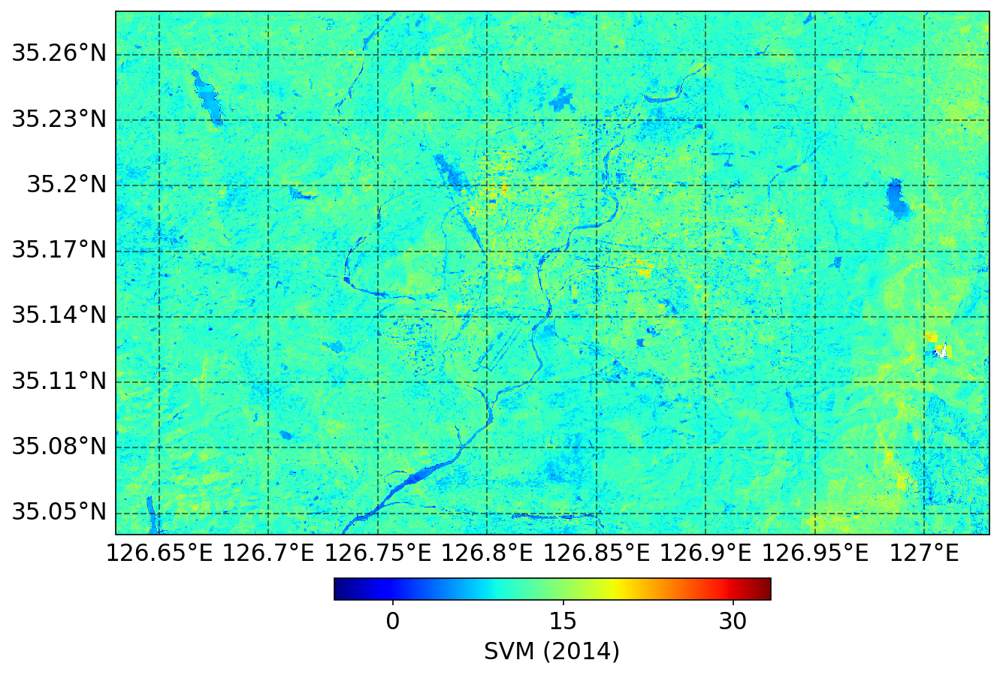

SVM -21.39415311823378 76.29702752775002


/tmp/ipykernel_2244579/627709615.py:8: RuntimeWarning: Mean of empty slice
  target = np.nanmean(data_vars[var_name], axis=2)


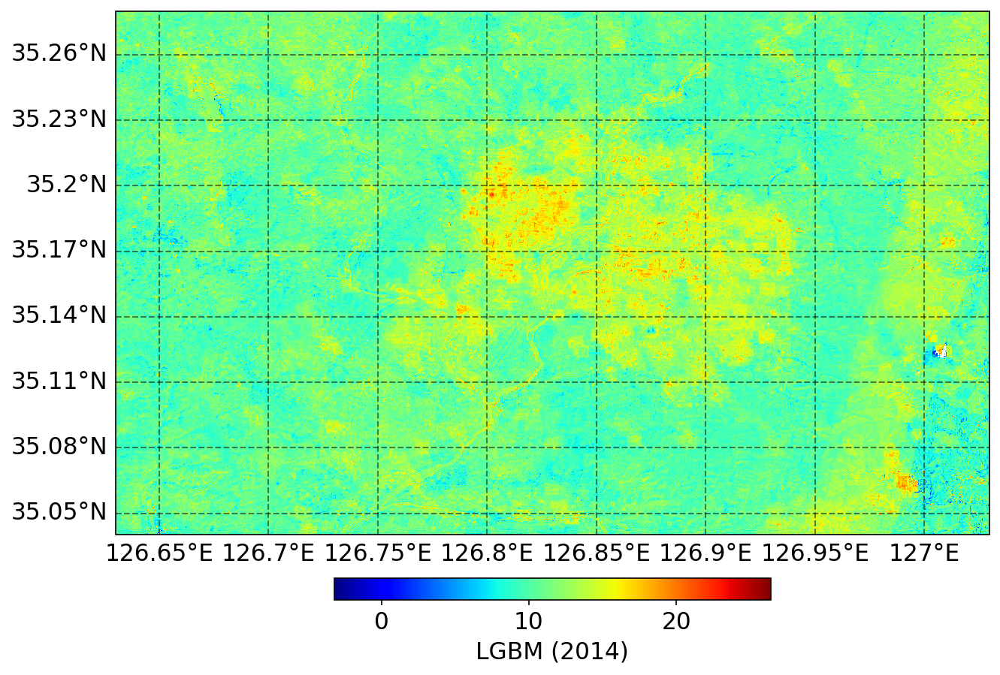

LGBM -3.9762338212695685 31.369150284636476


In [279]:
bound = [126.63, 127.03, 35.04, 35.28] # entire Gwangju
domain_lon, domain_lat = hGrid.generate_lon_lat_eqdgrid(0.01*0.03, bounds=bound)
m, n = np.shape(domain_lon)
print(np.shape(data_vars[var_name]))
print('True y', np.nanmin(outcome), np.nanmax(outcome))

for var_name in var_name_list:
    target = np.nanmean(data_vars[var_name], axis=2)
    hPlot.plot_map(domain_lon, domain_lat_ud, target, np.nanmin(target), np.nanmax(target), label_title=f'{var_name} ({year})', projection='PlateCarree')
    #target = data_vars[var_name][:, :, 30]
    #hPlot.plot_map(domain_lon, domain_lat_ud, target, np.nanmin(target), np.nanmax(target), label_title=f'{var_name} ({year})', projection='PlateCarree')
    print(var_name, np.nanmin(data_vars[var_name]), np.nanmax(data_vars[var_name]))